#### Segment Info
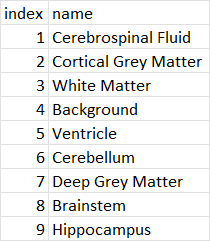

In [1]:
segments = [
    "Cerebrospinal Fluid",
    "Cortical Grey Matter",
    "White Matter",
    "Background",
    "Ventricle",
    "Cerebelum",
    "Deep Grey Matter",
    "Brainstem",
    "Hippocampus"
]

### Import Libraries

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torch.distributions as dist
from torchsummary import summary
import math
import os
import numpy as np
import time
import matplotlib.pyplot as plt
from prettytable import PrettyTable
from sklearn.model_selection import train_test_split
from tqdm import tqdm
from pathlib import Path
import re
from skimage.metrics  import structural_similarity as ssim
import plotly.io as pio
import plotly.express as px
import pandas as pd

pio.renderers.default = 'iframe'

from importlib import reload
import visualization

# locals
import model_architectures

reload(model_architectures)
from model_architectures import VAESegment, Data3DSegT2, SegMaskData, Data3DSegT1T2_toT2Seg

reload(visualization)
from visualization import brain_diff, viz_slices

C:\compute\envs\torch\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Define Paths

In [3]:
research_dir = r"D:/school/research"
code_dir = os.path.join(research_dir, "code")
model_dir = os.path.join(code_dir, "explore_again", "models")
data_dir = os.path.join(research_dir, "data")
dhcp_rel2 = os.path.join(data_dir, "dhcp_rel2")
processed_dir = os.path.join(dhcp_rel2, "processed")
volume_dir = os.path.join(processed_dir, "volumes")
seg_dir = os.path.join(processed_dir, "segments")
seg_vol_dir = os.path.join(processed_dir, "volume_segments")
pred_dir = os.path.join(dhcp_rel2, "predictions")
seg_pred_dir = os.path.join(pred_dir, "vae_9seg")

l1_dir = os.path.join(volume_dir, "l1")
l5_dir = os.path.join(volume_dir, "l5")

l1_seg_dir = os.path.join(seg_dir, "l1")
l5_seg_dir = os.path.join(seg_dir, "l5")

l1_seg_vol_dir = os.path.join(seg_vol_dir, "l1")
l5_seg_vol_dir = os.path.join(seg_vol_dir, "l5")

l1_seg_pred_dir = os.path.join(seg_pred_dir, "l1")
l5_seg_pred_dir = os.path.join(seg_pred_dir, "l5")

### Helper Functions

In [4]:
def exclude_segments(seg, indices):
    seg_slice = seg.copy()
    seg_slice[np.isin(seg_slice, indices)] = 0
    seg_slice[seg_slice != 0] = 1
    
    return seg_slice

### Load Data

In [5]:
np.random.seed(42)
num_samples = int(len(os.listdir(l1_dir)) / 2)
samples = np.array([i for i in range(0, num_samples)])
np.random.shuffle(samples)

split_val = int(0.8 * num_samples)
train_indices = samples[0:split_val]
val_indices = samples[split_val:]

num_test = int(len(os.listdir(l5_dir)) / 2)
test_indices = np.array([i for i in range(0, num_test)])

In [6]:
train = Data3DSegT1T2_toT2Seg(l1_dir, l1_seg_vol_dir, train_indices)
val = Data3DSegT1T2_toT2Seg(l1_dir, l1_seg_vol_dir, val_indices)
test = Data3DSegT1T2_toT2Seg(l5_dir, l5_seg_vol_dir, test_indices)

train_segments = SegMaskData(l1_seg_dir, train_indices)
val_segments = SegMaskData(l1_seg_dir, val_indices)
test_segments = SegMaskData(l5_seg_dir, test_indices)

batch_size = 1
train_loader = DataLoader(train, batch_size=batch_size)#, num_workers=1)
val_loader = DataLoader(val, batch_size=batch_size)#, num_workers=1)

### Run Segmented Model

In [7]:
model = VAESegment(2, 9)

# model = nn.DataParallel(model)
model.cuda()
criterion = nn.MSELoss()
learning_rate = 1e-3
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, eps=1e-07)

num_epochs = 70
# this works for batch size of 128, c=1
for epoch in range(num_epochs):
    total_loss = 0
    with tqdm(train_loader, unit="batch", ascii=' >=') as tepoch:
        model.train()
        data_counter = 0
        for data in tepoch:
            # clear gradients
            optimizer.zero_grad()
            
            # forward
            x, y = data
            x = x.cuda()
            y = y.cuda()
            output = model(x)
            loss = criterion(y, output)
            
            # backward
            loss.backward()
            optimizer.step()
            
            total_loss += loss.data
            data_counter += 1
        ## This is probably more memory efficient but doesn't appear necessary in this case
        # del x
        # del output
        # torch.cuda.empty_cache()
        
        total_loss /= data_counter
            
        tepoch.set_postfix(loss=loss.item())
        val_loss = 0
        model.eval()
        data_counter = 0
        for data in val_loader:
            with torch.no_grad():
                x, y = data
                x = x.cuda()
                y = y.cuda()
                output = model(x)
                loss = criterion(y, output)

                val_loss += loss.data
                data_counter += 1
        
        val_loss /= data_counter
        
        print('epoch [{}/{}], train_loss:{:.4f}, val_loss:{:.4f}'
              .format(epoch+1, num_epochs, total_loss, val_loss))

100%|=============================================================================| 166/166 [02:07<00:00,  1.30batch/s]


epoch [1/70], train_loss:0.0047, val_loss:0.0027


100%|=============================================================================| 166/166 [02:13<00:00,  1.25batch/s]


epoch [2/70], train_loss:0.0024, val_loss:0.0023


100%|=============================================================================| 166/166 [02:13<00:00,  1.25batch/s]


epoch [3/70], train_loss:0.0021, val_loss:0.0021


100%|=============================================================================| 166/166 [02:14<00:00,  1.23batch/s]


epoch [4/70], train_loss:0.0019, val_loss:0.0020


100%|=============================================================================| 166/166 [02:16<00:00,  1.21batch/s]


epoch [5/70], train_loss:0.0018, val_loss:0.0019


100%|=============================================================================| 166/166 [02:18<00:00,  1.20batch/s]


epoch [6/70], train_loss:0.0018, val_loss:0.0018


100%|=============================================================================| 166/166 [02:17<00:00,  1.21batch/s]


epoch [7/70], train_loss:0.0018, val_loss:0.0018


100%|=============================================================================| 166/166 [02:18<00:00,  1.20batch/s]


epoch [8/70], train_loss:0.0017, val_loss:0.0018


100%|=============================================================================| 166/166 [02:18<00:00,  1.20batch/s]


epoch [9/70], train_loss:0.0017, val_loss:0.0017


100%|=============================================================================| 166/166 [02:18<00:00,  1.20batch/s]


epoch [10/70], train_loss:0.0017, val_loss:0.0017


100%|=============================================================================| 166/166 [02:17<00:00,  1.20batch/s]


epoch [11/70], train_loss:0.0017, val_loss:0.0017


100%|=============================================================================| 166/166 [02:18<00:00,  1.20batch/s]


epoch [12/70], train_loss:0.0017, val_loss:0.0017


100%|=============================================================================| 166/166 [02:18<00:00,  1.20batch/s]


epoch [13/70], train_loss:0.0017, val_loss:0.0017


100%|=============================================================================| 166/166 [02:18<00:00,  1.20batch/s]


epoch [14/70], train_loss:0.0017, val_loss:0.0017


100%|=============================================================================| 166/166 [02:27<00:00,  1.12batch/s]


epoch [15/70], train_loss:0.0016, val_loss:0.0017


100%|=============================================================================| 166/166 [02:39<00:00,  1.04batch/s]


epoch [16/70], train_loss:0.0016, val_loss:0.0017


100%|=============================================================================| 166/166 [02:39<00:00,  1.04batch/s]


epoch [17/70], train_loss:0.0016, val_loss:0.0017


100%|=============================================================================| 166/166 [02:39<00:00,  1.04batch/s]


epoch [18/70], train_loss:0.0016, val_loss:0.0017


100%|=============================================================================| 166/166 [02:39<00:00,  1.04batch/s]


epoch [19/70], train_loss:0.0016, val_loss:0.0016


100%|=============================================================================| 166/166 [02:40<00:00,  1.04batch/s]


epoch [20/70], train_loss:0.0016, val_loss:0.0016


100%|=============================================================================| 166/166 [02:39<00:00,  1.04batch/s]


epoch [21/70], train_loss:0.0016, val_loss:0.0016


100%|=============================================================================| 166/166 [02:39<00:00,  1.04batch/s]


epoch [22/70], train_loss:0.0016, val_loss:0.0016


100%|=============================================================================| 166/166 [02:41<00:00,  1.03batch/s]


epoch [23/70], train_loss:0.0016, val_loss:0.0016


100%|=============================================================================| 166/166 [02:42<00:00,  1.02batch/s]


epoch [24/70], train_loss:0.0016, val_loss:0.0016


100%|=============================================================================| 166/166 [02:43<00:00,  1.02batch/s]


epoch [25/70], train_loss:0.0016, val_loss:0.0016


100%|=============================================================================| 166/166 [02:43<00:00,  1.02batch/s]


epoch [26/70], train_loss:0.0015, val_loss:0.0016


100%|=============================================================================| 166/166 [02:45<00:00,  1.00batch/s]


epoch [27/70], train_loss:0.0015, val_loss:0.0016


100%|=============================================================================| 166/166 [02:47<00:00,  1.01s/batch]


epoch [28/70], train_loss:0.0015, val_loss:0.0016


100%|=============================================================================| 166/166 [02:47<00:00,  1.01s/batch]


epoch [29/70], train_loss:0.0015, val_loss:0.0016


100%|=============================================================================| 166/166 [02:48<00:00,  1.02s/batch]


epoch [30/70], train_loss:0.0015, val_loss:0.0017


100%|=============================================================================| 166/166 [02:48<00:00,  1.02s/batch]


epoch [31/70], train_loss:0.0016, val_loss:0.0016


100%|=============================================================================| 166/166 [02:47<00:00,  1.01s/batch]


epoch [32/70], train_loss:0.0015, val_loss:0.0016


100%|=============================================================================| 166/166 [02:48<00:00,  1.01s/batch]


epoch [33/70], train_loss:0.0015, val_loss:0.0015


100%|=============================================================================| 166/166 [02:50<00:00,  1.03s/batch]


epoch [34/70], train_loss:0.0015, val_loss:0.0015


100%|=============================================================================| 166/166 [02:48<00:00,  1.02s/batch]


epoch [35/70], train_loss:0.0015, val_loss:0.0015


100%|=============================================================================| 166/166 [02:50<00:00,  1.03s/batch]


epoch [36/70], train_loss:0.0015, val_loss:0.0016


100%|=============================================================================| 166/166 [02:48<00:00,  1.02s/batch]


epoch [37/70], train_loss:0.0015, val_loss:0.0016


100%|=============================================================================| 166/166 [02:47<00:00,  1.01s/batch]


epoch [38/70], train_loss:0.0014, val_loss:0.0016


  9%|=======                                                                       | 15/166 [00:15<02:39,  1.06s/batch]


KeyboardInterrupt: 

### Save Model

In [8]:
model_path = os.path.join(model_dir, "vae_rel2T1t2_segmented_t2_out.pt")
torch.save(model.state_dict(), model_path)

### Load Model

In [8]:
model_path = os.path.join(model_dir, "vae_rel2T1t2_segmented_t2_out.pt")
model = VAESegment(2, 9)
model.load_state_dict(torch.load(model_path))
model.cuda()
model.eval()

VAESegment(
  (model): Sequential(
    (0): ResnetEncoder(
      (pass1): Sequential(
        (0): InstanceNorm3d(2, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (1): ReLU()
        (2): Conv3d(2, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
      )
      (pass2): Sequential(
        (0): InstanceNorm3d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (1): ReLU()
        (2): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
      )
      (conv_bypass): Conv3d(2, 32, kernel_size=(3, 3, 3), stride=(4, 4, 4))
      (activation_bypass): ReLU()
    )
    (1): ResnetEncoder(
      (pass1): Sequential(
        (0): InstanceNorm3d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (1): ReLU()
        (2): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
      )
      (pass2): Sequential(
        (0): InstanceNorm3d(32, eps=1e-05, momentum=0

### Get Losses

In [9]:
metrics_dir = os.path.join(code_dir, "explore_again", "metrics", "combined_segments")

In [17]:
%%time

train_losses = []
train_seg_losses = []
criterion = nn.MSELoss()
for idx, img in enumerate(train):
    x = torch.Tensor(np.reshape(img[0], (1, 1, 256, 256, 256))).cuda()
    output = model(x)
    og = np.reshape(x.cpu().detach().numpy(), (256, 256, 256))
    pred = np.reshape(output.cpu().detach().numpy(), (9, 256, 256, 256))
    
    train_seg_losses.append(((img[1] - pred)**2).mean(axis=(1,2,3)))
    train_losses.append(float(criterion(torch.Tensor(og), torch.Tensor(np.sum(pred, axis=0)))))

np.save(os.path.join(metrics_dir, "train_losses.npy"), train_losses)
np.save(os.path.join(metrics_dir, "train_seg_losses.npy"), train_seg_losses)

CPU times: total: 21min 1s
Wall time: 3min 22s


In [18]:
%%time

val_losses = []
val_seg_losses = []
criterion = nn.MSELoss()
for idx, img in enumerate(val):
    x = torch.Tensor(np.reshape(img[0], (1, 1, 256, 256, 256))).cuda()
    output = model(x)
    og = np.reshape(x.cpu().detach().numpy(), (256, 256, 256))
    pred = np.reshape(output.cpu().detach().numpy(), (9, 256, 256, 256))
    
    val_seg_losses.append(((img[1] - pred)**2).mean(axis=(1,2,3)))
    val_losses.append(float(criterion(torch.Tensor(og), torch.Tensor(np.sum(pred, axis=0)))))

np.save(os.path.join(metrics_dir, "val_losses.npy"), val_losses)
np.save(os.path.join(metrics_dir, "val_seg_losses.npy"), val_seg_losses)

CPU times: total: 5min 19s
Wall time: 51.5 s


In [10]:
%%time

test_losses = []
test_seg_losses = []
criterion = nn.MSELoss()
for idx, img in enumerate(test):
    x = torch.Tensor(np.reshape(img[0], (1, 1, 256, 256, 256))).cuda()
    output = model(x)
    og = np.reshape(x.cpu().detach().numpy(), (256, 256, 256))
    pred = np.reshape(output.cpu().detach().numpy(), (9, 256, 256, 256))
    
    test_seg_losses.append(((img[1] - pred)**2).mean(axis=(1,2,3)))
    test_losses.append(float(criterion(torch.Tensor(og), torch.Tensor(np.sum(pred, axis=0)))))

np.save(os.path.join(metrics_dir, "test_losses.npy"), test_losses)
np.save(os.path.join(metrics_dir, "test_seg_losses.npy"), test_seg_losses)

CPU times: total: 3min 23s
Wall time: 36.9 s


In [125]:
segment_label = []
run_name = []
values = []

def get_values(list_o_vals, run_name):
    s = []
    v = []
    r = []
    for m in list_o_vals:
        for idx, n in enumerate(m):
            s.append(segments[idx])
            v.append(n)
            r.append(run_name)
    return s, v, r

train_labels, train_values, train_runs = get_values(train_seg_losses, "Train")
val_labels, val_values, val_runs = get_values(val_seg_losses, "Val")
test_labels, test_values, test_runs = get_values(test_seg_losses, "Test")

values.extend(train_values)
run_name.extend(train_runs)
segment_label.extend(train_labels)

values.extend(val_values)
run_name.extend(val_runs)
segment_label.extend(val_labels)

values.extend(test_values)
run_name.extend(test_runs)
segment_label.extend(test_labels)

segment_df = pd.DataFrame({"run": run_name, "segment": segment_label, "values": values})

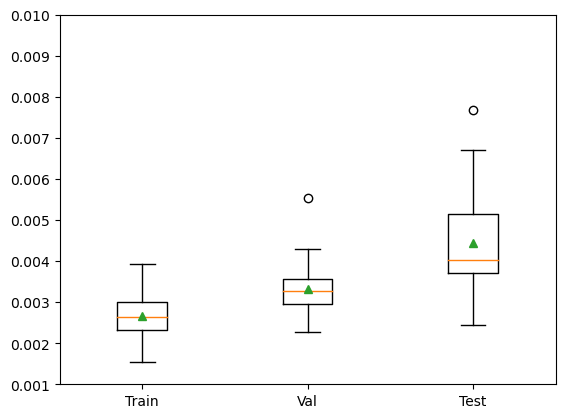

In [140]:
plt.ylim(0.001, 0.01)
bp = plt.boxplot(
    [train_losses, val_losses, test_losses],
    vert=True,
    labels=['Train', 'Val', 'Test'],
    showfliers=True,
    showmeans=True
)

In [138]:

# df = px.data.tips()

fig = px.box(
    segment_df,
    x="segment",
    y="values",
    color="run",
    color_discrete_map={
        "Train": "green",
        "Val": "orange",
        "Test": "red"
    }
)
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
# fig.show()

### Train Results

SSIM:  0.9273452261105525


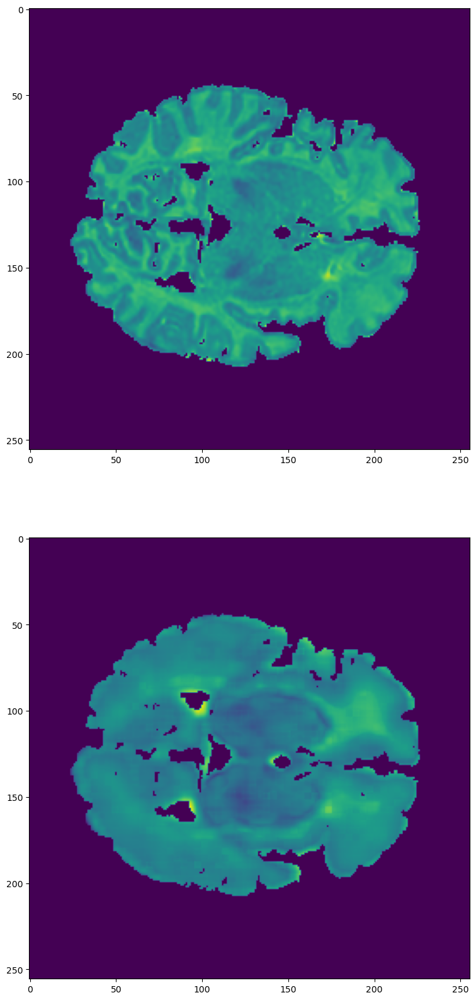

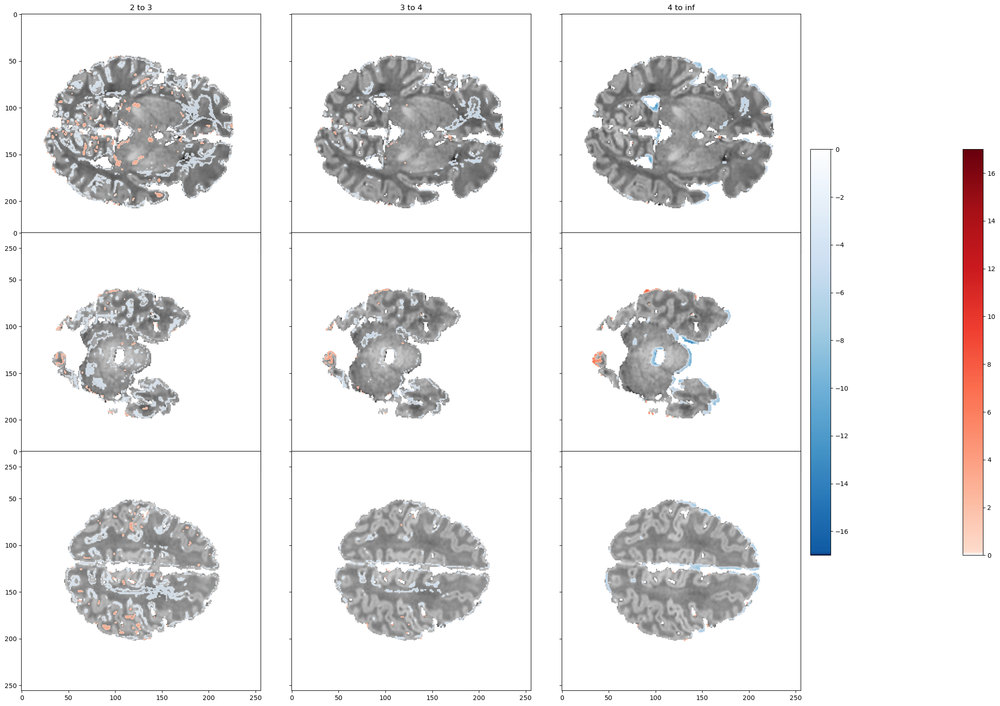

In [13]:
index = 0
x = torch.Tensor(np.reshape(train[index][0], (1, 2, 256, 256, 256))).cuda()
output = model(x)

og = np.reshape(x.cpu().detach().numpy(), (2, 256, 256, 256))
og_t1 = og[0]
og_t2 = og[1]
pred = np.reshape(output.cpu().detach().numpy(), (9, 256, 256, 256))
pred = np.sum(pred, axis=0)

s = 128

# exclude csf and background
seg = train_segments[index]
seg_slice = exclude_segments(seg[:,:,s], [1, 4, 5])
og_slc = og_t2[:,:,s] * seg_slice
pred_slc = pred[:,:,s] * seg_slice

(score, diff) = ssim(og_slc, pred_slc, full=True)
print("SSIM: ", score)


fig, ax = plt.subplots(2, figsize=(20,20))
ax[0].imshow(og_slc)
ax[1].imshow(pred_slc)

full_seg = exclude_segments(seg, [1, 4, 5])
viz_slices(og_t2 * full_seg, pred * full_seg)

### Val Results

SSIM:  0.9194543115418199


D:\school\research\code\explore_again\modeling\segment_recreation\visualization.py:155: UserWarning:

Trying to register the cmap 'above_mean2' which already exists.

D:\school\research\code\explore_again\modeling\segment_recreation\visualization.py:162: UserWarning:

Trying to register the cmap 'below_mean2' which already exists.



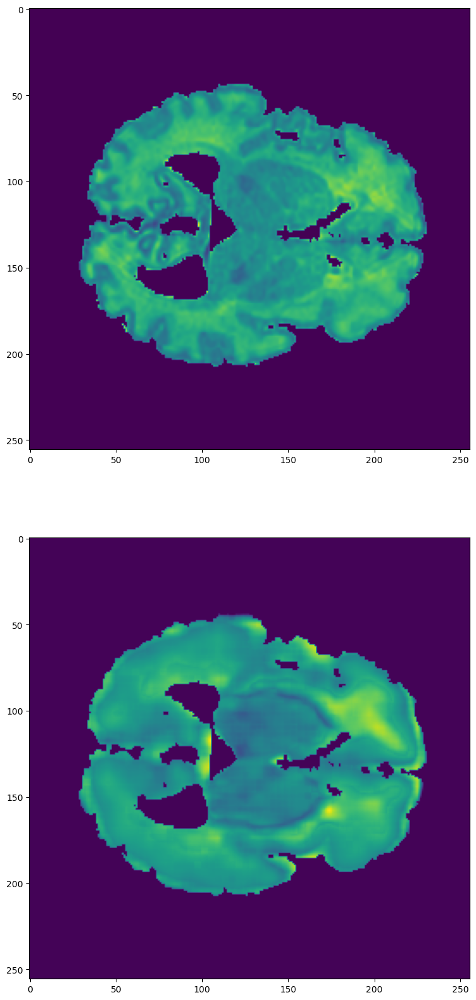

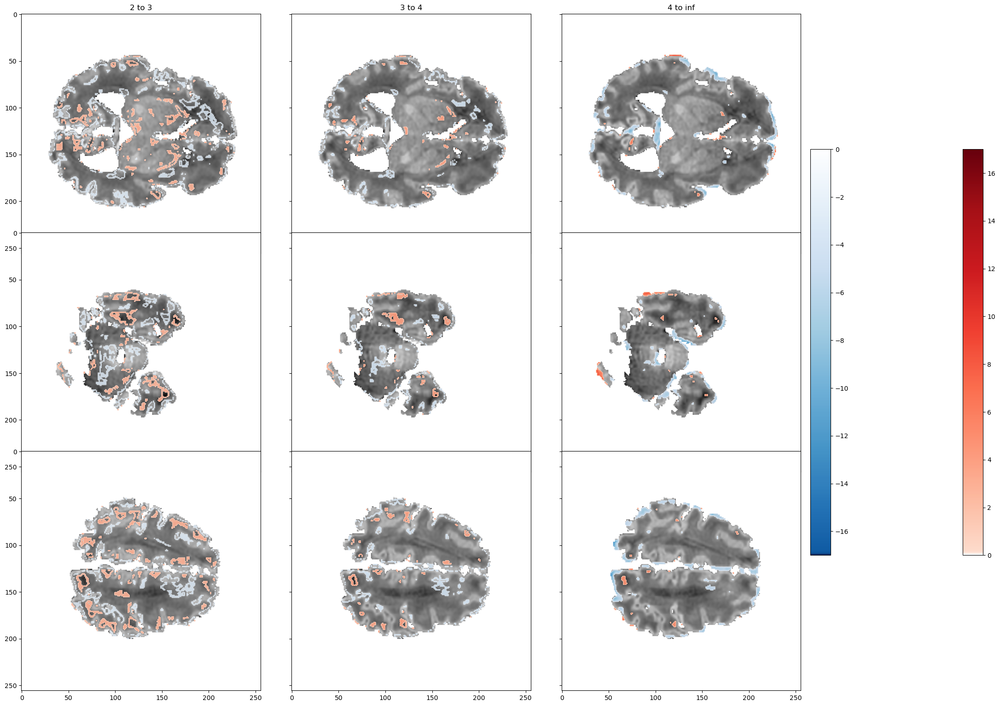

In [14]:
index = 0
x = torch.Tensor(np.reshape(val[index][0], (1, 2, 256, 256, 256))).cuda()
output = model(x)

og = np.reshape(x.cpu().detach().numpy(), (2, 256, 256, 256))
og_t1 = og[0]
og_t2 = og[1]
pred = np.reshape(output.cpu().detach().numpy(), (9, 256, 256, 256))
pred = np.sum(pred, axis=0)

s = 128

# exclude csf and background
seg = val_segments[index]
seg_slice = exclude_segments(seg[:,:,s], [1, 4, 5])
og_slc = og_t2[:,:,s] * seg_slice
pred_slc = pred[:,:,s] * seg_slice

(score, diff) = ssim(og_slc, pred_slc, full=True)
print("SSIM: ", score)


fig, ax = plt.subplots(2, figsize=(20,20))
ax[0].imshow(og_slc)
ax[1].imshow(pred_slc)

full_seg = exclude_segments(seg, [1, 4, 5])
viz_slices(og_t2 * full_seg, pred * full_seg)

### Test Results

SSIM:  0.8888661391752367


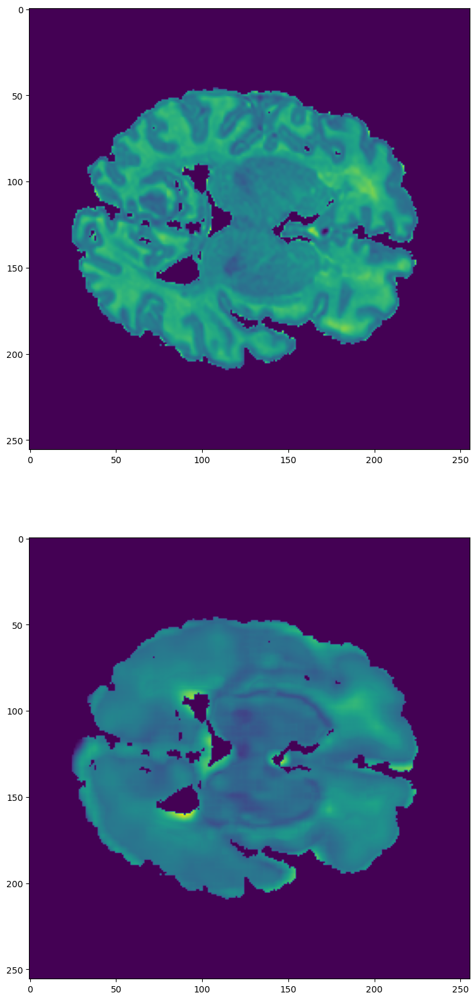

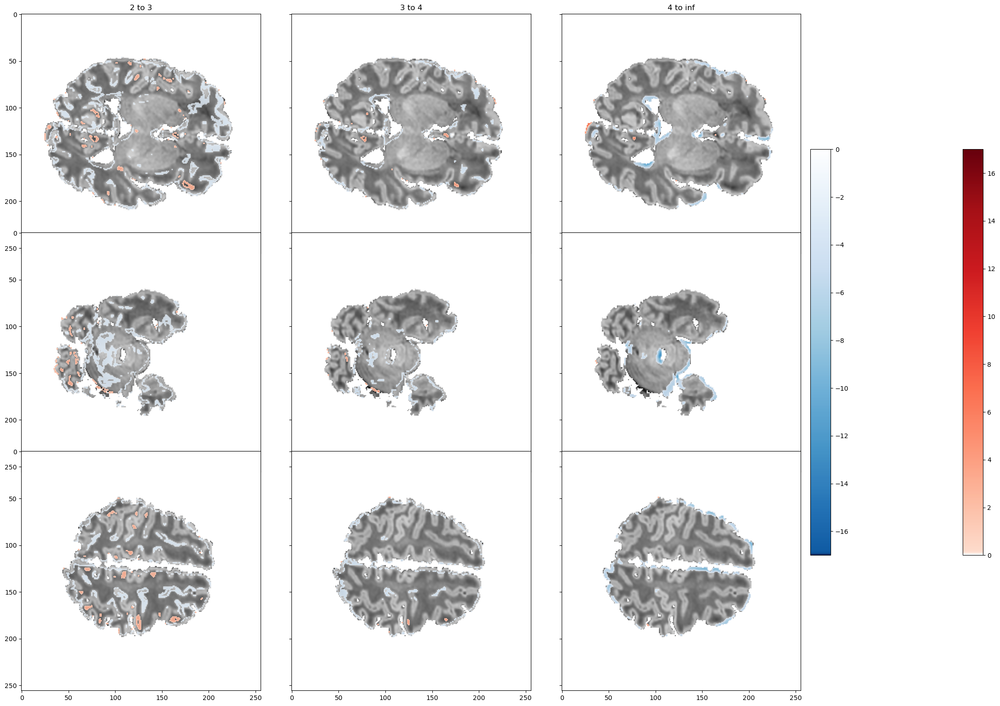

In [17]:
index = 2
x = torch.Tensor(np.reshape(test[index][0], (1, 2, 256, 256, 256))).cuda()
output = model(x)

og = np.reshape(x.cpu().detach().numpy(), (2, 256, 256, 256))
og_t1 = og[0]
og_t2 = og[1]
pred = np.reshape(output.cpu().detach().numpy(), (9, 256, 256, 256))
pred = np.sum(pred, axis=0)

s = 128

# exclude csf and background
seg = test_segments[index]
seg_slice = exclude_segments(seg[:,:,s], [1, 4, 5])
og_slc = og_t2[:,:,s] * seg_slice
pred_slc = pred[:,:,s] * seg_slice

(score, diff) = ssim(og_slc, pred_slc, full=True)
print("SSIM: ", score)


fig, ax = plt.subplots(2, figsize=(20,20))
ax[0].imshow(og_slc)
ax[1].imshow(pred_slc)

full_seg = exclude_segments(seg, [1, 4, 5])
viz_slices(og_t2 * full_seg, pred * full_seg)

### Assess Some Results

In [22]:
index = 0
x = torch.Tensor(np.reshape(train[index][0], (1, 2, 256, 256, 256))).cuda()
output = model(x)

# og = np.reshape(x.cpu().detach().numpy(), (256, 256, 256))
og = np.reshape(train[index][1], (9, 256, 256, 256))
res = np.reshape(output.cpu().detach().numpy(), (9, 256, 256, 256))
# pred = np.sum(pred, axis=0)

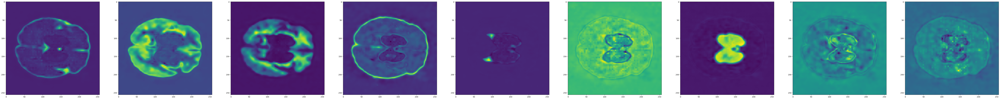

In [44]:
fig, ax = plt.subplots(1, 9, figsize=(100,20))

for i in range(0, 9):
    ax[i].imshow(res[i][:,:,128])

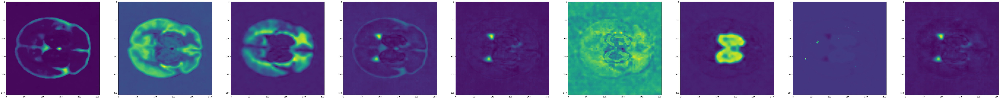

In [23]:
fig, ax = plt.subplots(1, 9, figsize=(100,20))

for i in range(0, 9):
    ax[i].imshow(res[i][:,:,128])

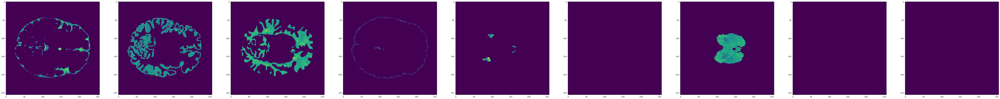

In [45]:
fig, ax = plt.subplots(1, 9, figsize=(100,20))

for i in range(0, 9):
    ax[i].imshow(og[i][:,:,128])

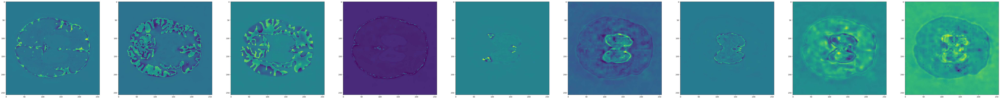

In [46]:
fig, ax = plt.subplots(1, 9, figsize=(100,20))

for i in range(0, 9):
    ax[i].imshow(og[i][:,:,128] - res[i][:,:,128])

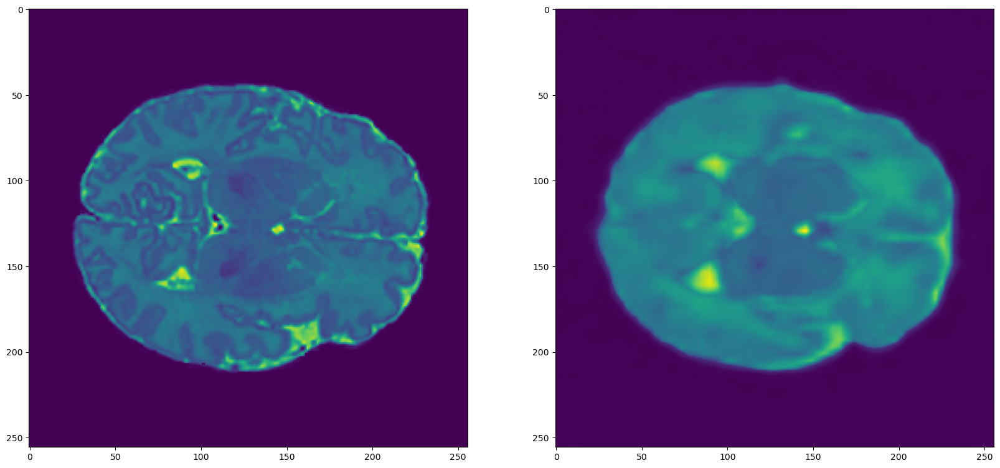

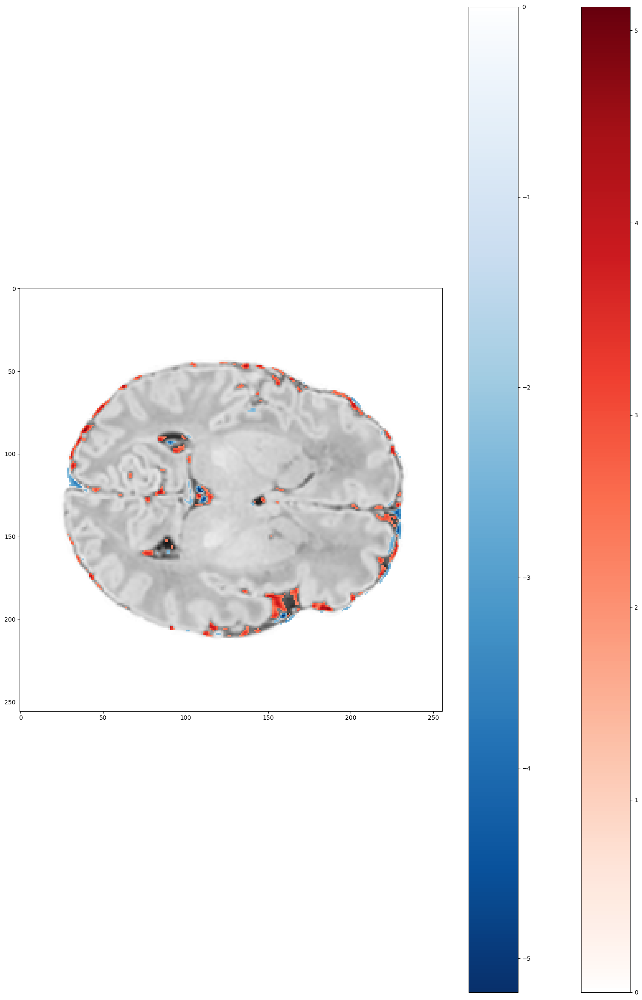

In [22]:
fig, ax = plt.subplots(1, 2, figsize=(20,20))
ax[0].imshow(np.sum(og[:,:,:,128], axis=0))
ax[1].imshow(np.sum(res[:,:,:,128], axis=0))

brain_diff(np.sum(og[:,:,:,128], axis=0), np.sum(res[:,:,:,128], axis=0), threshold=2)

In [69]:
og.shape

(9, 256, 256, 256)

D:\school\research\code\explore_again\modeling\vae\visualization.py:87: UserWarning: Trying to register the cmap 'above_mean' which already exists.
  plt.register_cmap(cmap=map_object)
D:\school\research\code\explore_again\modeling\vae\visualization.py:94: UserWarning: Trying to register the cmap 'below_mean' which already exists.
  plt.register_cmap(cmap=map_object)


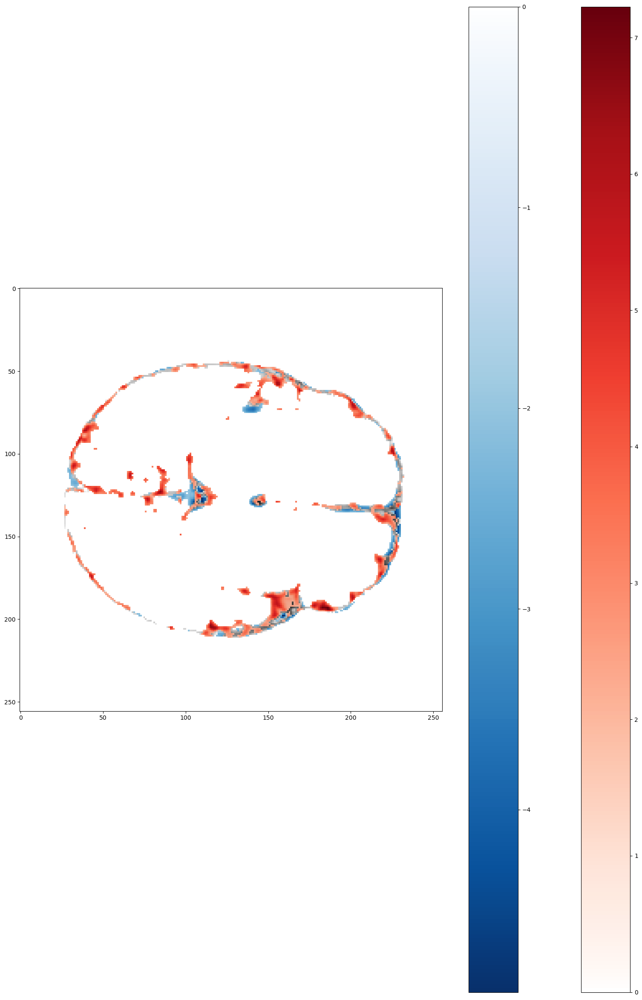

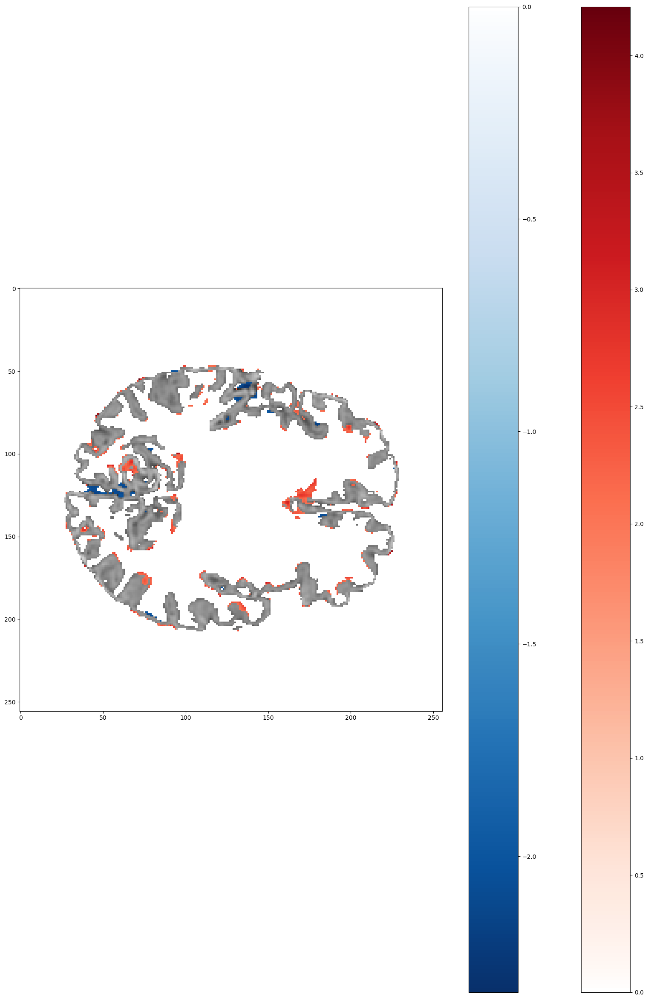

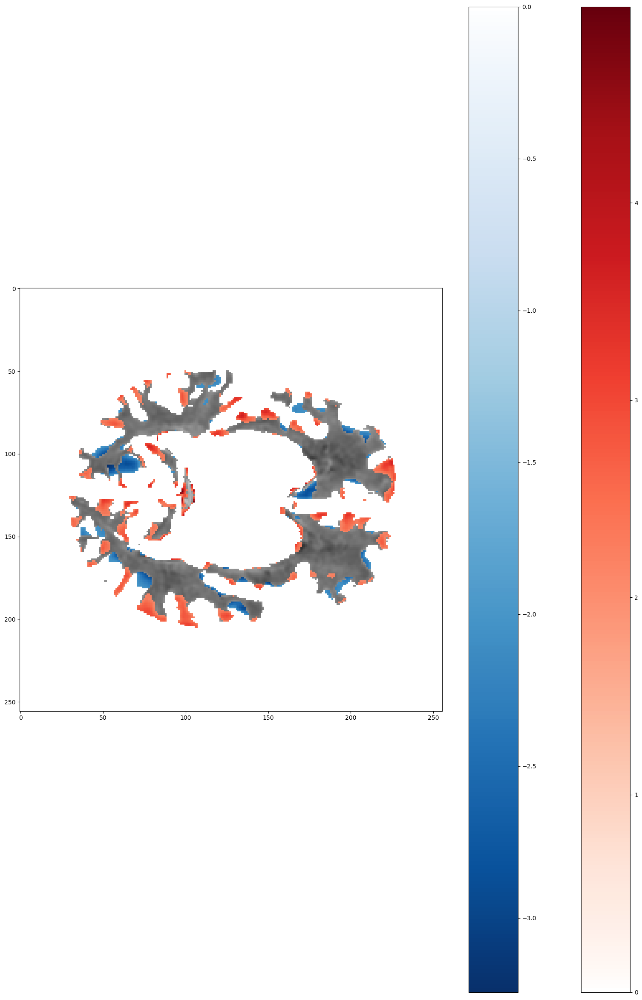

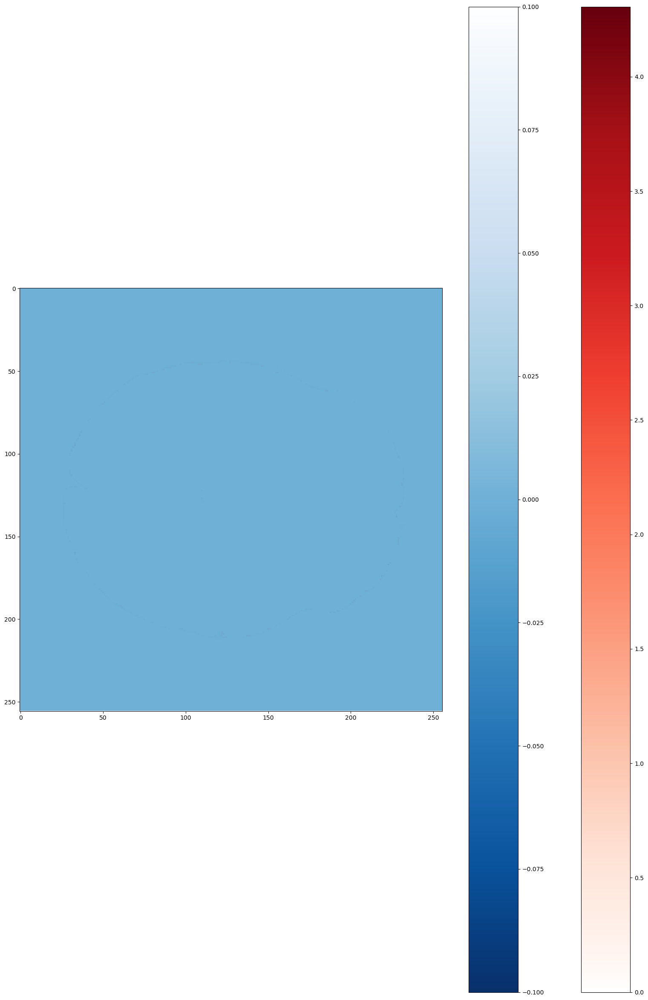

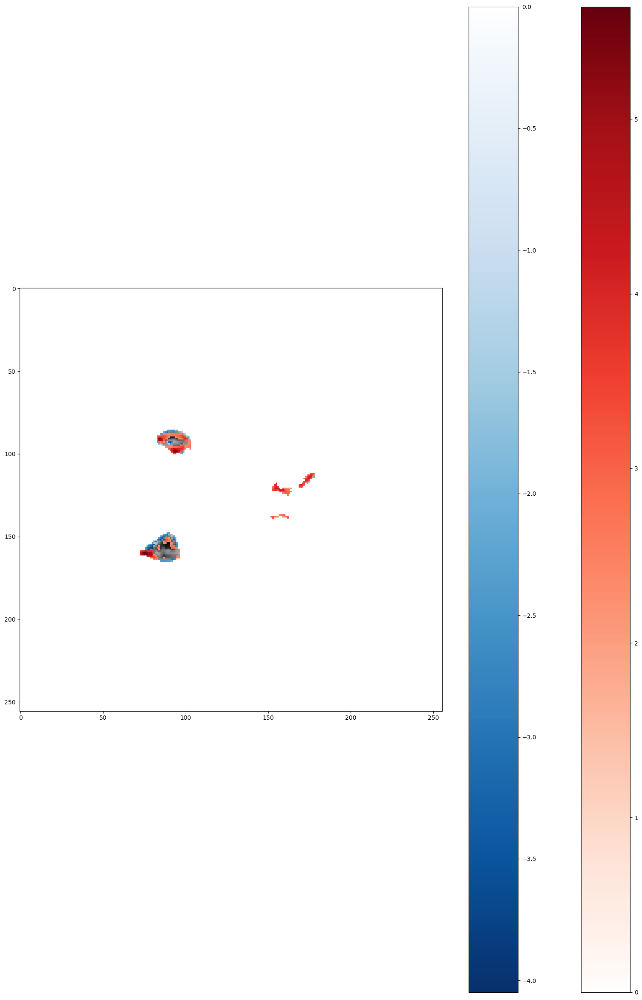

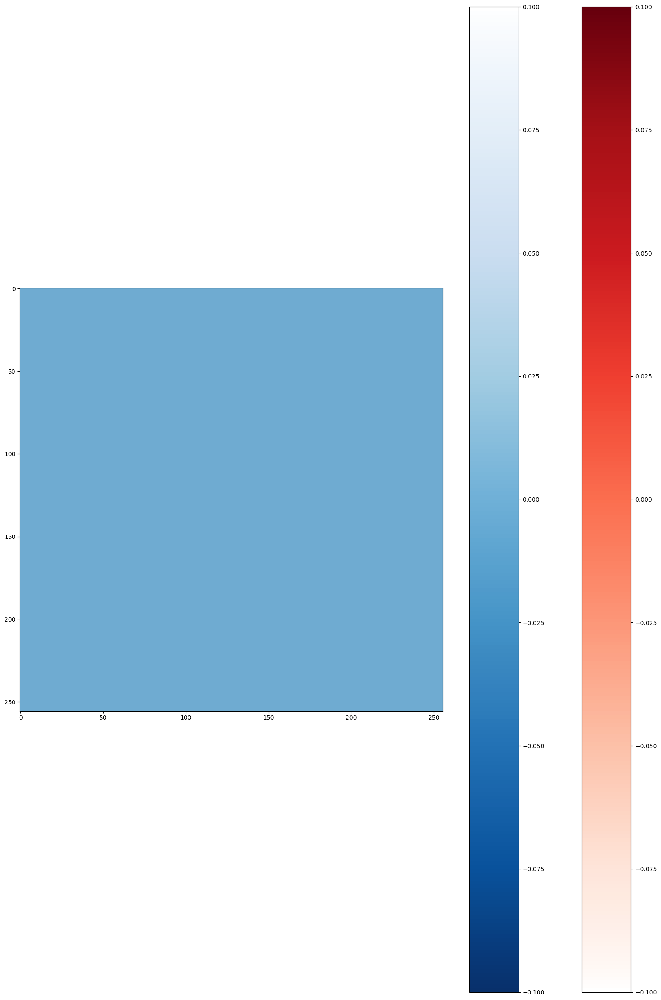

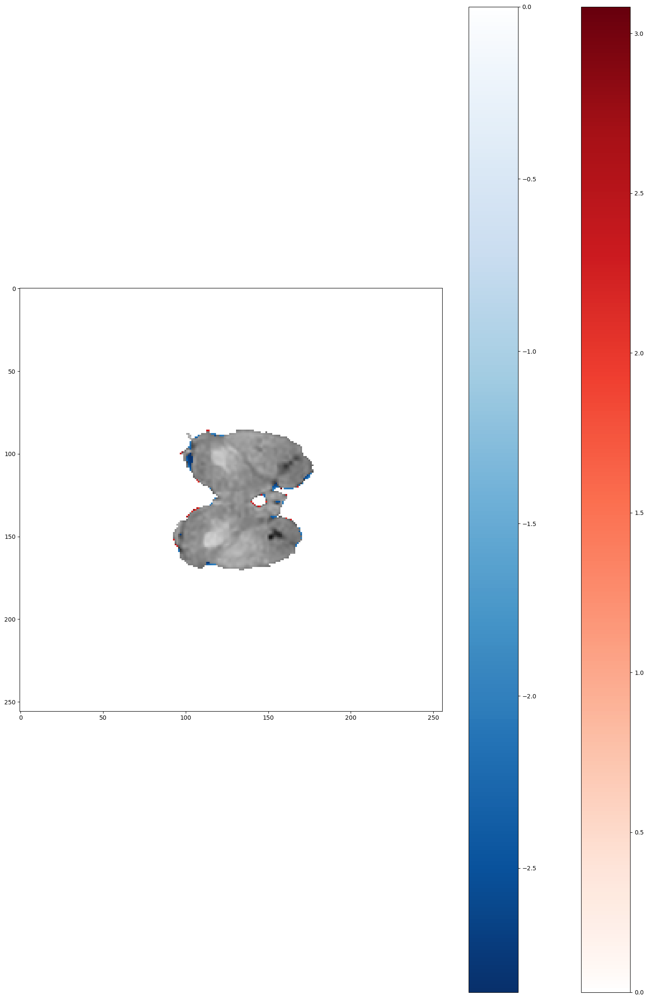

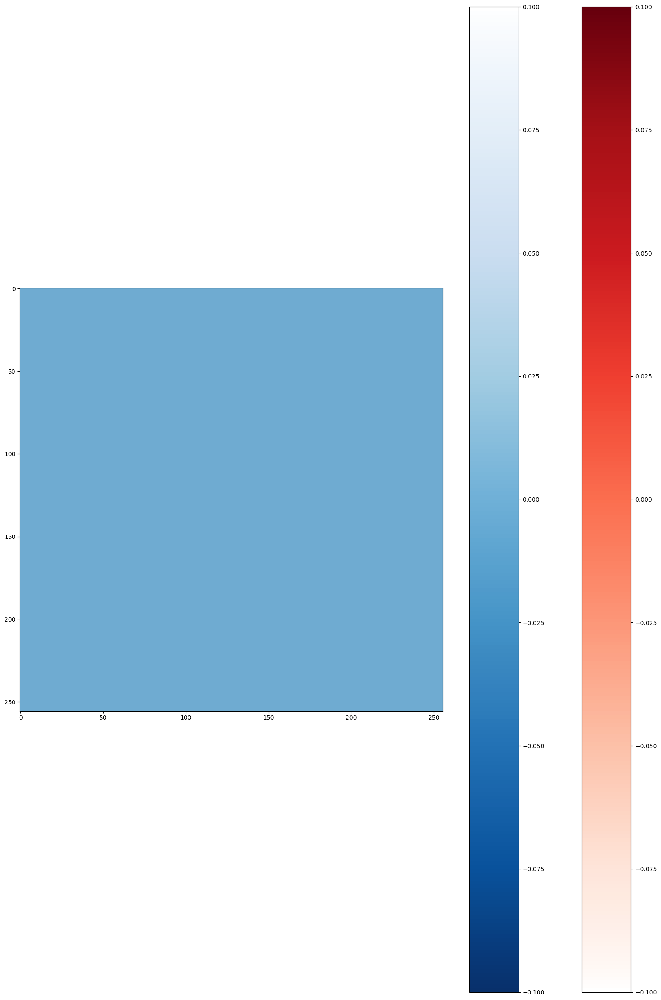

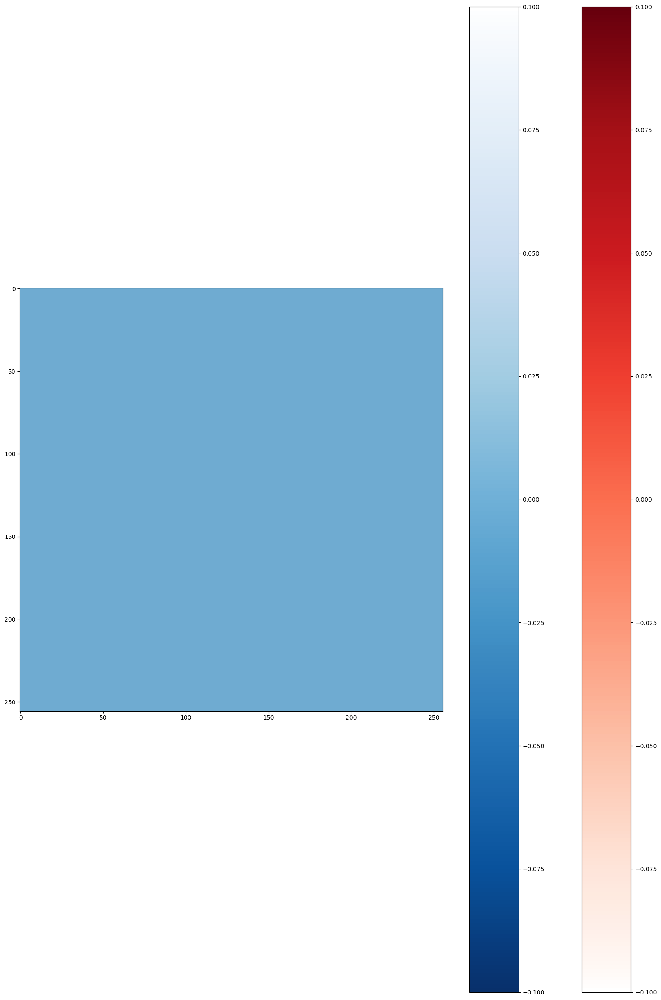

In [23]:
for m in range(0, 9):
    brain_diff(og[m][:,:,128], res[m][:,:,128], threshold=2)